This notebook analyzes the O$_2$ budget from MITgcm+BLING output. Dissolved oxygen in the ocean's interior is simulated following:

$$
\frac{\partial{O_2}}{\partial{t}}= \underbrace{- \frac{\partial{U.O_2}}{\partial{x}} -\frac{\partial{V.O_2}}{\partial{y}}}_\text{Lateral Advection}
- \overbrace{\frac{\partial{W.O_2}}{\partial{z}}}^\text{Vertical Advection}
+ \underbrace{A_h.\nabla^2{O_2}}_\text{Lateral Mixing}
+\overbrace{\frac{\partial{}}{\partial{z}}k.\frac{\partial{O_2}}{\partial{z}}}^\text{Vertical Mixing}
+ \underbrace{ J(O_2)  }_\text{Sources - Sinks}
$$

#### Calculate monthly climatological mean budget terms, including total advection:

$$
{\frac{\partial{O_2}}{\partial{t}}}= -\overbrace{{U} . \nabla{({O_2})}}^\text{Advection}  
+ \underbrace{A_h.\nabla^2{O_2}}_\text{Lateral Mixing}
+\overbrace{{\frac{\partial{}}{\partial{z}}k.\frac{\partial{O_2}}{\partial{z}}}}^\text{Vertical Mixing}
+ \underbrace{{ J(O_2)}  }_\text{Sources - Sinks}
$$

#### Calculate monthly climatological mean budget terms, including total advection:

$$
\overline{\frac{\partial{O_2}}{\partial{t}}}= -\underbrace{\overline{U} . \nabla{(\overline{O_2})}}_\text{Mean Advection}  
-\overbrace{\overline{U'.\nabla{O_2'}}}^\text{Eddy Advection} 
+\overbrace{\overline{\frac{\partial{}}{\partial{z}}k.\frac{\partial{O_2}}{\partial{z}}}}^\text{Vertical Mixing}
+ \underbrace{\overline{ J(O_2)}  }_\text{Sources - Sinks}
$$

In [75]:
%load_ext autoreload
%autoreload 2
%matplotlib inline
import warnings
warnings.simplefilter("ignore") # Silence warnings

import xarray as xr
import numpy as np
from tqdm import tqdm

import matplotlib.colors as colors
import matplotlib.ticker as mticker
import matplotlib.patches as patches
import cmocean
import cartopy
import cartopy.crs as ccrs
from cartopy import util
from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER
import cartopy.feature as cft
import proplot
# from xmovie import *
import matplotlib.pyplot as plt
from utils import *

from xgcm import Grid

plt.rcParams["figure.facecolor"] = 'white'

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload



---
## Spin up Dask Cluster/Client

In [76]:
import dask
from dask_jobqueue import PBSCluster
from dask.distributed import Client

def CLSTR(N=1,T=30,M=109, P=10):
    nnodes = N; ntime="00:"+str(T)+":00"; nmemory= str(M)+"GB"; nprocesses= P
    cluster = PBSCluster(
        cores=nnodes, # The number of cores you want
        memory=nmemory, # Amount of memory
        processes=nprocesses, # How many processes
        walltime=ntime, # Amount of wall time
        queue='casper', # The type of queue to utilize (/glade/u/apps/dav/opt/usr/bin/execcasper)
        local_directory='/glade/scratch/yeddebba/tmp', # Use your local directory
#         resource_spec='select=1:ncpus=1:mem=10GB', # Specify resources
        project='USIO0028', # Input your project ID here
        interface='ib0', # Interface to use
    )
    cluster.scale(1*nprocesses)
    dask.config.set({'distributed.dashboard.link':'https://jupyterhub.hpc.ucar.edu/stable/user/{USER}/proxy/{port}/status'})
    client = Client(cluster)
    
    return client


In [77]:
C=CLSTR(1,45,500,36)
C

Connection method: Cluster object,Cluster type: dask_jobqueue.PBSCluster
Dashboard: https://jupyterhub.hpc.ucar.edu/stable/user/yeddebba/proxy/43970/status,
Dashboard: https://jupyterhub.hpc.ucar.edu/stable/user/yeddebba/proxy/43970/status,Workers: 0
Total threads: 0,Total memory: 0 B
Comm: tcp://10.12.206.46:44111,Workers: 0
Dashboard: https://jupyterhub.hpc.ucar.edu/stable/user/yeddebba/proxy/43970/status,Total threads: 0
Started: Just now,Total memory: 0 B


### Calculate density fields

In [3]:
# import gsw

# # 5-day mean temp, O2 and salt from Forward MITgcm run with BGC
# for j in tqdm(np.arange(5,8)):
#     dst=xr.open_mfdataset('/glade/scratch/yeddebba/Mesoscale/TPOSE/MITgcm_BLING_BUDGET_2010_2013_5DAY/tpfwd6_THETA_5day_201'+str(j)+'.nc')
#     dss=xr.open_mfdataset('/glade/scratch/yeddebba/Mesoscale/TPOSE/MITgcm_BLING_BUDGET_2010_2013_5DAY/tpfwd6_SALT_5day_201'+str(j)+'.nc')
#     dsp=xr.Dataset()
#     dsp['PD']=gsw.density.sigma0(dss.SALT,dst.THETA)+1000
#     dsp.PD.attrs['long_name']='Potential density'
#     dsp.PD.attrs['units']='kg m-3'
#     dsp.to_netcdf('/glade/scratch/yeddebba/Mesoscale/TPOSE/MITgcm_BLING_BUDGET_2010_2013_5DAY/tpfwd6_PD_5day_201'+str(j)+'.nc')

### align times and create Yearly datasets of variables and budget diagnotsics 

In [4]:
# for j in tqdm(np.arange(0,8)):
#     N=73
#     dsv=xr.open_mfdataset('/glade/scratch/yeddebba/Mesoscale/TPOSE/MITgcm_BLING_BUDGET_2010_2013_5DAY/tpfwd6_?VEL_5day_201'+str(j)+'.nc').isel(time=np.arange(0,N))
#     dst=xr.open_mfdataset('/glade/scratch/yeddebba/Mesoscale/TPOSE/MITgcm_BLING_BUDGET_2010_2013_5DAY/tpfwd6_T*_5day_201'+str(j)+'.nc').isel(time=np.arange(0,N))
#     dsp=xr.open_mfdataset('/glade/scratch/yeddebba/Mesoscale/TPOSE/MITgcm_BLING_BUDGET_2010_2013_5DAY/tpfwd6_PD_5day_201'+str(j)+'.nc').isel(time=np.arange(0,N))
#     dsb=xr.open_mfdataset('/glade/scratch/yeddebba/Mesoscale/TPOSE/MITgcm_BLING_BUDGET_2010_2013_5DAY/tpfwd6_*_O2_5day_201'+str(j)+'.nc').isel(time=np.arange(0,N))
#     dsb['time']=dst.time
#     dsb2=xr.open_mfdataset('/glade/scratch/yeddebba/Mesoscale/TPOSE/MITgcm_BLING_BUDGET_2010_2013_5DAY/tpfwd6_adv_[hv][uw]O2_5day_201'+str(j)+'.nc').isel(time=np.arange(0,N))
#     dsb2['time']=dst.time
#     dsb=xr.merge([dsb,dsb2],compat='override')
#     dsb['rVOL']=dst.drF*dst.rA*dst.hFacC
#     dst=xr.merge([dst,dsv,dsp],compat='override')
#     dst['rVOL']=dst.drF*dst.rA*dst.hFacC
#     dsb.to_netcdf('/glade/scratch/yeddebba/Mesoscale/TPOSE/MITgcm_BLING_BUDGET_2010_2013_5DAY/budgets/budgets_201'+str(j)+'.nc')
#     dst.to_netcdf('/glade/scratch/yeddebba/Mesoscale/TPOSE/MITgcm_BLING_BUDGET_2010_2013_5DAY/budgets/variables_201'+str(j)+'.nc')

### Open full period variables and budget diagnotsics 

In [12]:
# dsr=xr.open_mfdataset(
#     '/glade/scratch/yeddebba/Mesoscale/TPOSE/MITgcm_BLING_BUDGET_2010_2013_5DAY/budgets/variables_201[01234567].nc')
# dsr

# dsw=xr.open_mfdataset(
#     '/glade/scratch/yeddebba/Mesoscale/TPOSE/MITgcm_BLING_BUDGET_2010_2013_5DAY/budgets/budgets_201[01234567].nc')
# dsw

### Create Grid using XGCM 

In [4]:
def mitgcm_grid(dsr):
    dsr['drW'] = dsr.hFacW * dsr.drF #vertical cell size at u point
    dsr['drS'] = dsr.hFacS * dsr.drF #vertical cell size at v point
    dsr['drC'] = dsr.hFacC * dsr.drF #vertical cell size at tracer point

    metrics = {
        ('X',): ['dxC', 'dxG'], # X distances
        ('Y',): ['dyC', 'dyG'], # Y distances
        ('Z',): ['drW', 'drS', 'drC'], # Z distances
        ('X', 'Y'): ['rA', 'rAs', 'rAw'] # Areas
    }
    grid = Grid(dsr, metrics=metrics,periodic=False)

    dsr['dxF'] = grid.interp(dsr.dxC,'X',boundary='extend')
    dsr['dyF'] = grid.interp(dsr.dyC,'Y',boundary='extend')
    metrics = {
        ('X',): ['dxC', 'dxG','dxF'], # X distances
        ('Y',): ['dyC', 'dyG','dyF'], # Y distances
        ('Z',): ['drW', 'drS', 'drC'], # Z distances
        ('X', 'Y'): ['rA', 'rAs', 'rAw'] # Areas
    }
    grid = Grid(dsr, metrics=metrics,periodic=False)

    return grid

In [30]:
def MITgcm_advective_budget(dsx):
    ''' calculate o2 budget using O2 and Velocity fields '''
    di=xr.Dataset()
    U_O2=dsx.UVEL*grid.interp(dsx.TRAC03,'X',metric_weighted=['X','Y'],boundary="extend")
    V_O2=dsx.VVEL*grid.interp(dsx.TRAC03,'Y',metric_weighted=['X','Y'],boundary="extend")
    W_O2=dsx.WVEL*grid.interp(dsx.TRAC03,'Z',boundary="extend")

    di['U_O2'] = grid.derivative(U_O2,'X',boundary="fill",fill_value=0) 
    di.U_O2.attrs['units'] = 'mol/s'

    di['V_O2'] = grid.derivative(V_O2,'Y',boundary="fill",fill_value=0) 
    di.V_O2.attrs['units'] = 'mol/s'
    di['W_O2'] = -grid.derivative(W_O2,'Z',boundary="extend") 
    di.W_O2.attrs['units'] = 'mol/s'
    di['DIVm'] = di.U_O2+di.V_O2+di.W_O2
    di.DIVm.attrs['units'] = 'mol/s'

    di['U_dO2'] = grid.interp(dsx.UVEL* grid.derivative(dsx.TRAC03,'X',boundary="fill", fill_value=0),'X',metric_weighted=['X','Y'],boundary="fill", fill_value=0)
    di.U_dO2.attrs['units'] = 'mol/s'
    di['V_dO2'] = grid.interp(dsx.VVEL*grid.derivative(dsx.TRAC03,'Y',boundary="fill", fill_value=0) ,'Y',metric_weighted=['X','Y'],boundary="fill", fill_value=0)
    di.V_dO2.attrs['units'] = 'mol/s'

    # Here we need to set vertical velocity at surface =0 because there is no flux out of surface. See Code by Ariane Verdy 
    dsx.WVEL[:,0,:,:]=0
    di['O2_dW'] = -dsx.TRAC03*grid.derivative(dsx.WVEL,'Z',boundary="extend")
    di['W_dO2']=(di.W_O2-di['O2_dW']) # di['W_dO2'] = grid.interp(-dsv.WVEL,'Z',boundary="extend")*grid.derivative(grid.interp(dst.TRAC03,'Z',boundary="extend"),'Z',boundary="extend")
    di.W_dO2.attrs['units'] = 'mol/s'
    di['DIVd'] = di.U_dO2+di.V_dO2+di.W_dO2
    di.DIVd.attrs['units'] = 'mol/s'
    
    return di

### Loop through model output and scale/calculate full budget terms

where

$$
\frac{\partial{O_2}}{\partial{t}}= \underbrace{- \frac{\partial{U.O_2}}{\partial{x}} -\frac{\partial{V.O_2}}{\partial{y}}}_\text{Lateral Advection}
- \overbrace{\frac{\partial{W.O_2}}{\partial{z}}}^\text{Vertical Advection}
+ \underbrace{A_h.\nabla^2{O_2}}_\text{Lateral Mixing}
+\overbrace{\frac{\partial{}}{\partial{z}}k.\frac{\partial{O_2}}{\partial{z}}}^\text{Vertical Mixing}
+ \underbrace{ J(O_2)  }_\text{Sources - Sinks}
$$



In [8]:
for j in tqdm(np.arange(0,8)):
    dsr=xr.open_mfdataset('/glade/scratch/yeddebba/Mesoscale/TPOSE/MITgcm_BLING_BUDGET_2010_2013_5DAY/budgets/variables_201'+str(j)+'.nc')
    # grid=mitgcm_grid(dsr)
    dm=MITgcm_advective_budget(dsr)
    dm.to_netcdf('/glade/scratch/yeddebba/Mesoscale/TPOSE/MITgcm_BLING_BUDGET_2010_2013_5DAY/budgets/adv_budget_201'+str(j)+'.nc')

100%|██████████| 1/1 [10:46<00:00, 646.25s/it]


# Mean Budget Terms

#### Calculate monthly climatological mean budget terms, including total advection:

$$
\overline{\frac{\partial{O_2}}{\partial{t}}}= \underbrace{- \overline{\frac{\partial{U.O_2}}{\partial{x}}} -\overline{\frac{\partial{V.O_2}}{\partial{y}}}}_\text{Lateral Advection}
- \overbrace{\overline{\frac{\partial{W.O_2}}{\partial{z}}}}^\text{Vertical Advection}
+ \underbrace{\overline{A_h.\nabla^2{O_2}}}_\text{Lateral Mixing}
+\overbrace{\overline{\frac{\partial{}}{\partial{z}}k.\frac{\partial{O_2}}{\partial{z}}}}^\text{Vertical Mixing}
+ \underbrace{\overline{ J(O_2)}  }_\text{Sources - Sinks}
$$



#### including total advection of O2 gradient flux terms:

$$
\overline{-\boldsymbol{U}.\nabla{O_2}} = -\overline{U.\frac{\partial{O_2}}{\partial{x}}} - \overline{V.\frac{\partial{O_2}}{\partial{y}}}-\overline{W.\frac{\partial{O_2}}{\partial{z}}} 
$$


where the mean $\overline{X}$ refers to the monthly climatological mean

In [9]:
db=xr.open_mfdataset('/glade/scratch/yeddebba/Mesoscale/TPOSE/MITgcm_BLING_BUDGET_2010_2013_5DAY/budgets/adv_budget_201?.nc')#,chunks={"Z": 10, "YC": 51,"time":50})
dx=db.DIVm.groupby('time.month').mean(dim='time')
dx.to_netcdf('/glade/scratch/yeddebba/Mesoscale/TPOSE/MITgcm_BLING_BUDGET_2010_2013_5DAY/budgets/monthly/DIVm_monthly.nc')
dx=db.DIVd.groupby('time.month').mean(dim='time')
dx.to_netcdf('/glade/scratch/yeddebba/Mesoscale/TPOSE/MITgcm_BLING_BUDGET_2010_2013_5DAY/budgets/monthly/DIVd_monthly.nc')

In [3]:
dsb=xr.open_mfdataset('/glade/scratch/yeddebba/Mesoscale/TPOSE/MITgcm_BLING_BUDGET_2010_2013_5DAY/budgets/budgets_201?.nc')#,chunks={"Z": 10, "YC": 51,"time":50})
dsb

dsbm=dsb.tend_O2.groupby('time.month').mean(dim='time')
dsbm.to_netcdf('/glade/scratch/yeddebba/Mesoscale/TPOSE/MITgcm_BLING_BUDGET_2010_2013_5DAY/budgets/monthly/tend_O2_monthly.nc')

dsbm=dsb.adv_h_O2.groupby('time.month').mean(dim='time')
dsbm.to_netcdf('/glade/scratch/yeddebba/Mesoscale/TPOSE/MITgcm_BLING_BUDGET_2010_2013_5DAY/budgets/monthly/adv_h_O2_monthly.nc')

dsbm=dsb.adv_v_O2.groupby('time.month').mean(dim='time')
dsbm.to_netcdf('/glade/scratch/yeddebba/Mesoscale/TPOSE/MITgcm_BLING_BUDGET_2010_2013_5DAY/budgets/monthly/adv_v_O2_monthly.nc')

dsbm=dsb.dif_v_O2.groupby('time.month').mean(dim='time')
dsbm.to_netcdf('/glade/scratch/yeddebba/Mesoscale/TPOSE/MITgcm_BLING_BUDGET_2010_2013_5DAY/budgets/monthly/dif_v_O2_monthly.nc')

dsbm=dsb.bio_O2.groupby('time.month').mean(dim='time')
dsbm.to_netcdf('/glade/scratch/yeddebba/Mesoscale/TPOSE/MITgcm_BLING_BUDGET_2010_2013_5DAY/budgets/monthly/bio_O2_monthly.nc')

dsbm=dsb.surf_O2.groupby('time.month').mean(dim='time')
dsbm.to_netcdf('/glade/scratch/yeddebba/Mesoscale/TPOSE/MITgcm_BLING_BUDGET_2010_2013_5DAY/budgets/monthly/surf_O2_monthly.nc')


#### Calculate monthly climatological mean budget terms, including total advection:

$$
\overline{\frac{\partial{O_2}}{\partial{t}}}= -\underbrace{\nabla{(\overline{U}. \overline{O2})}}_\text{Mean Advection}  
-\overbrace{\overline{U'.\nabla{O_2'}}}^\text{Eddy Advection} 
+ \underbrace{\overline{A_h.\nabla^2{O_2}}}_\text{Lateral Mixing}
+\overbrace{\overline{\frac{\partial{}}{\partial{z}}k.\frac{\partial{O_2}}{\partial{z}}}}^\text{Vertical Mixing}
+ \underbrace{\overline{ J(O_2)}  }_\text{Sources - Sinks}
$$

#### including total advection of O2 gradient flux terms:

$$
\overline{-\boldsymbol{U}.\nabla{O_2}} = -\overline{U.\frac{\partial{O_2}}{\partial{x}}} - \overline{V.\frac{\partial{O_2}}{\partial{y}}}-\overline{W.\frac{\partial{O_2}}{\partial{z}}} 
$$

# Mean Advective Terms

#### Calculate monthly climatological mean full advective terms:

$$
-\nabla{(\overline{U}. \overline{O2})}= -\frac{\partial{\overline{U}.\overline{O_2}}}{\partial{x}}-\frac{\partial{\overline{V}.\overline{O_2}}}{\partial{y}}-\frac{\partial{\overline{W}.\overline{O_2}}}{\partial{z}}
$$

#### and mean advection of O2 gradient flux terms: 

$$
-\overline{U}.\nabla{\overline{O_2}} = -\overline{U}.\frac{\partial{\overline{O_2}}}{\partial{x}} -\overline{V}.\frac{\partial{\overline{O_2}}}{\partial{y}} -\overline{W}.\frac{\partial{\overline{O_2}}}{\partial{z}}
$$

where the mean, $\overline{X}$, refers to the monthly climatological mean

In [4]:
dsr=xr.open_mfdataset('/glade/scratch/yeddebba/Mesoscale/TPOSE/MITgcm_BLING_BUDGET_2010_2013_5DAY/budgets/variables_201?.nc')['TRAC03']
dsrm=dsr.groupby('time.month').mean(dim='time')
dsrm.to_netcdf('/glade/scratch/yeddebba/Mesoscale/TPOSE/MITgcm_BLING_BUDGET_2010_2013_5DAY/budgets/monthly/O2_monthly.nc')

dsr=xr.open_mfdataset('/glade/scratch/yeddebba/Mesoscale/TPOSE/MITgcm_BLING_BUDGET_2010_2013_5DAY/budgets/variables_201?.nc')['UVEL']
dsrm=dsr.groupby('time.month').mean(dim='time')
dsrm.to_netcdf('/glade/scratch/yeddebba/Mesoscale/TPOSE/MITgcm_BLING_BUDGET_2010_2013_5DAY/budgets/monthly/UVEL_monthly.nc')

dsr=xr.open_mfdataset('/glade/scratch/yeddebba/Mesoscale/TPOSE/MITgcm_BLING_BUDGET_2010_2013_5DAY/budgets/variables_201?.nc')['VVEL']
dsrm=dsr.groupby('time.month').mean(dim='time')
dsrm.to_netcdf('/glade/scratch/yeddebba/Mesoscale/TPOSE/MITgcm_BLING_BUDGET_2010_2013_5DAY/budgets/monthly/VVEL_monthly.nc')

dsr=xr.open_mfdataset('/glade/scratch/yeddebba/Mesoscale/TPOSE/MITgcm_BLING_BUDGET_2010_2013_5DAY/budgets/variables_201?.nc')['WVEL']
dsrm=dsr.groupby('time.month').mean(dim='time')
dsrm.to_netcdf('/glade/scratch/yeddebba/Mesoscale/TPOSE/MITgcm_BLING_BUDGET_2010_2013_5DAY/budgets/monthly/WVEL_monthly.nc')

In [22]:
dsr=xr.open_mfdataset(['/glade/scratch/yeddebba/Mesoscale/TPOSE/MITgcm_BLING_BUDGET_2010_2013_5DAY/budgets/monthly/UVEL_monthly.nc',
                       '/glade/scratch/yeddebba/Mesoscale/TPOSE/MITgcm_BLING_BUDGET_2010_2013_5DAY/budgets/monthly/VVEL_monthly.nc',
                       '/glade/scratch/yeddebba/Mesoscale/TPOSE/MITgcm_BLING_BUDGET_2010_2013_5DAY/budgets/monthly/WVEL_monthly.nc',
                       '/glade/scratch/yeddebba/Mesoscale/TPOSE/MITgcm_BLING_BUDGET_2010_2013_5DAY/budgets/monthly/O2_monthly.nc',])
grid=mitgcm_grid(dsr)
dm=MITgcm_advective_budget(dsr)
dm.to_netcdf('/glade/scratch/yeddebba/Mesoscale/TPOSE/MITgcm_BLING_BUDGET_2010_2013_5DAY/budgets/monthly/Mean_DIV_O2_monthly.nc')

# Eddy Advective Terms

#### Calculate Eddy term using eddy decompostion as residual of mean total full advective terms - mean total full advective terms:

$$
- \nabla.{\overline{U O_2}}=-\nabla.{\overline{U}\space \overline{O_2}}-\nabla.{\overline{U' O_2'}}
$$
so that 

$$
-\nabla.{\overline{U' O_2'}}=- \nabla.{\overline{U O_2}}+\nabla.{\overline{U}\space \overline{O_2}}
$$

#### eddy advection of O2 gradient flux terms: :
$$
-\overline{U'.\nabla{O_2'}} = - \overline{U.\nabla{O_2}} + \overline{U} . \nabla{\overline{O_2}}
$$

In [50]:
da=xr.open_mfdataset(['/glade/scratch/yeddebba/Mesoscale/TPOSE/MITgcm_BLING_BUDGET_2010_2013_5DAY/budgets/monthly/adv_h_O2_monthly.nc',
                       '/glade/scratch/yeddebba/Mesoscale/TPOSE/MITgcm_BLING_BUDGET_2010_2013_5DAY/budgets/monthly/adv_v_O2_monthly.nc',])
da

dm=xr.open_mfdataset('/glade/scratch/yeddebba/Mesoscale/TPOSE/MITgcm_BLING_BUDGET_2010_2013_5DAY/budgets/monthly/Mean_DIV_O2_monthly.nc')
dm

# 
# # de['Up_O2p']=dudm.U_O2-dud.U_O2
# # de['Vp_O2p']=dudm.V_O2-dud.V_O2
# # de['Wp_O2p']=dudm.W_O2-dud.W_O2
# de['DIVp']=dudm.DIVm-dud.DIVm

de=xr.Dataset()
de['Up_dO2p']=da.adv_h_O2-(dm.U_dO2+dm.V_dO2)
de['Wp_dO2p']=da.adv_v_O2-(dm.W_dO2)
de['DIVdp']=de['Up_dO2p']+de['Wp_dO2p']
de

de.to_netcdf('/glade/scratch/yeddebba/Mesoscale/TPOSE/MITgcm_BLING_BUDGET_2010_2013_5DAY/budgets/monthly/eddy_DIV_O2_monthly.nc')

### Show Budget Closure:

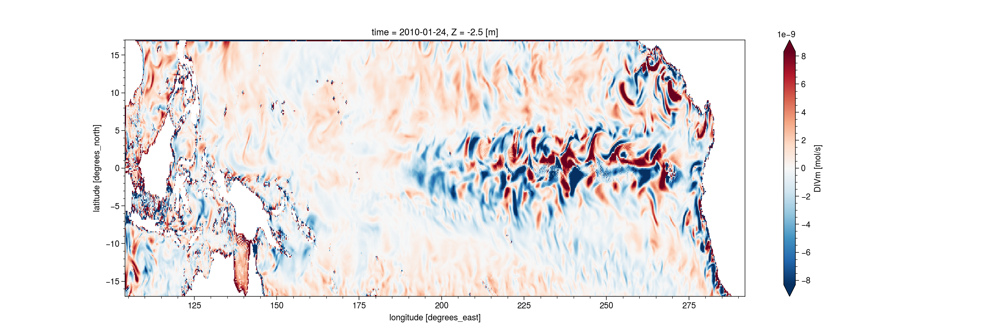

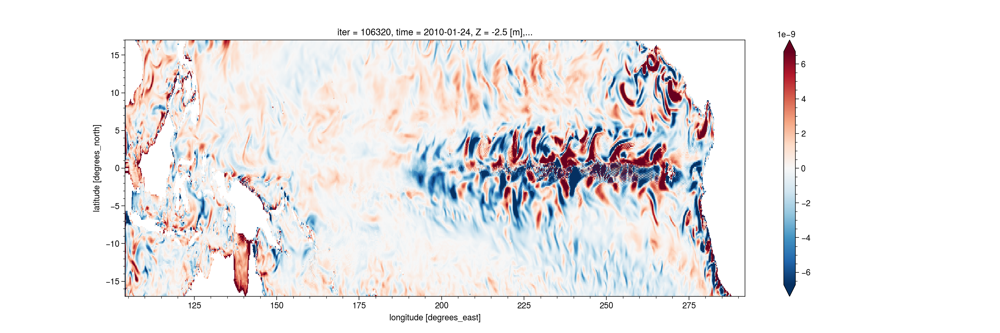

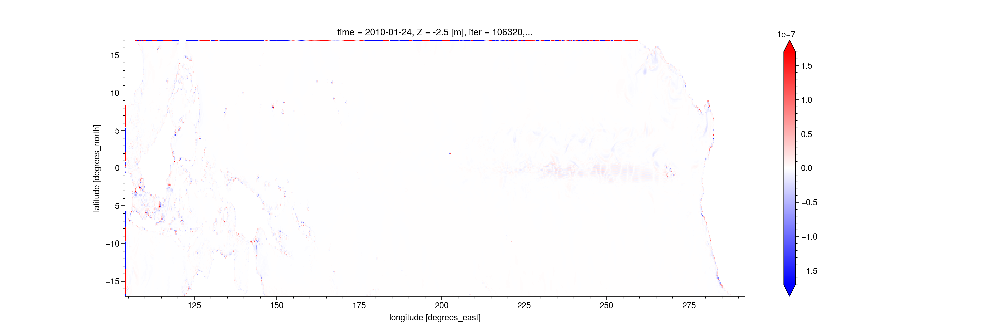

In [347]:
z=0; t=4
(di.DIVm.isel(Z=z,time=t)).plot(figsize=(15,5),robust=True)
(dsb.adv_huO2.isel(Z=z,time=t)+dsb.adv_vwO2.isel(Z=z,time=t)).plot(figsize=(15,5),robust=True)
(di.DIVm.isel(Z=z,time=t)-dsb.adv_huO2.isel(Z=z,time=t)-dsb.adv_vwO2.isel(Z=z,time=t)).plot(figsize=(15,5),vmin=-1.7e-7,vmax=1.7e-7,cmap='bwr')

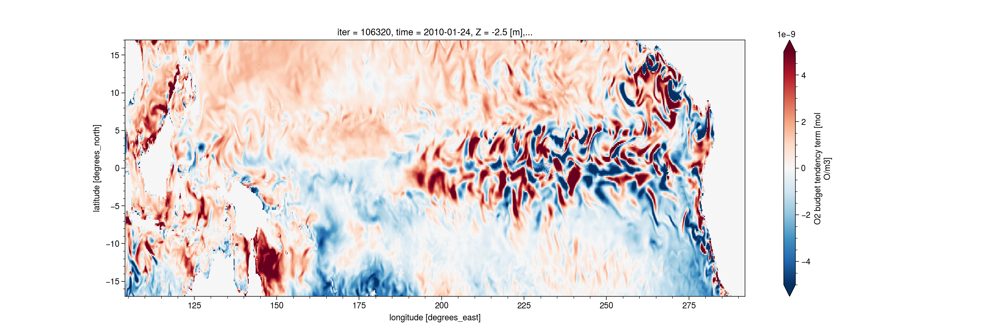

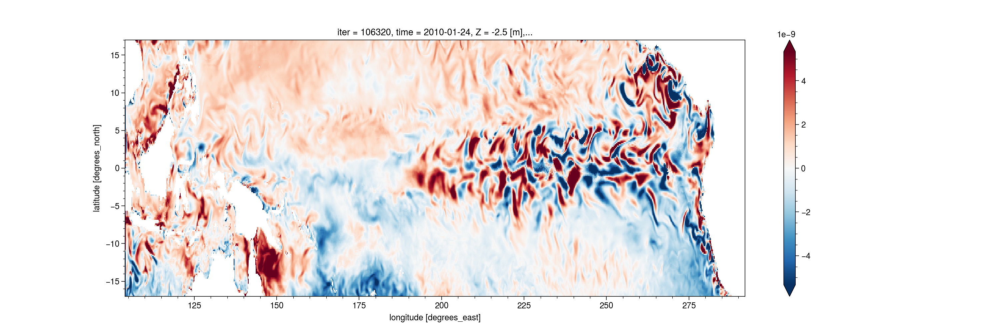

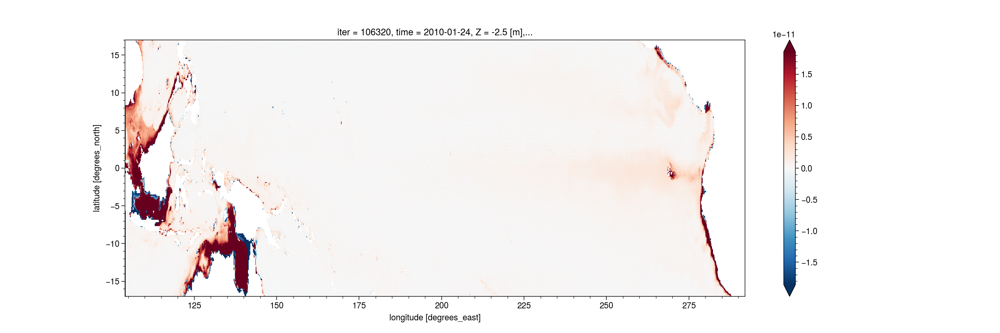

In [233]:
z=0; t=4
(dsb.tend_O2.isel(Z=z,time=t)).plot(figsize=(15,5),robust=True)
(-dsb.adv_h_O2.isel(Z=z,time=t)-dsb.adv_v_O2.isel(Z=z,time=t)-dsb.dif_h_O2.isel(Z=z,time=t)-dsb.dif_v_O2.isel(Z=z,time=t)+dsb.bio_O2.isel(Z=z,time=t)+dsb.surf_O2.isel(Z=z,time=t)).plot(figsize=(15,5),robust=True)
(-dsb.tend_O2.isel(Z=z,time=t)-dsb.adv_h_O2.isel(Z=z,time=t)-dsb.dif_h_O2.isel(Z=z,time=t)-dsb.adv_v_O2.isel(Z=z,time=t)-dsb.dif_v_O2.isel(Z=z,time=t)+dsb.bio_O2.isel(Z=z,time=t)+dsb.surf_O2.isel(Z=z,time=t)).plot(figsize=(15,5),robust=True)

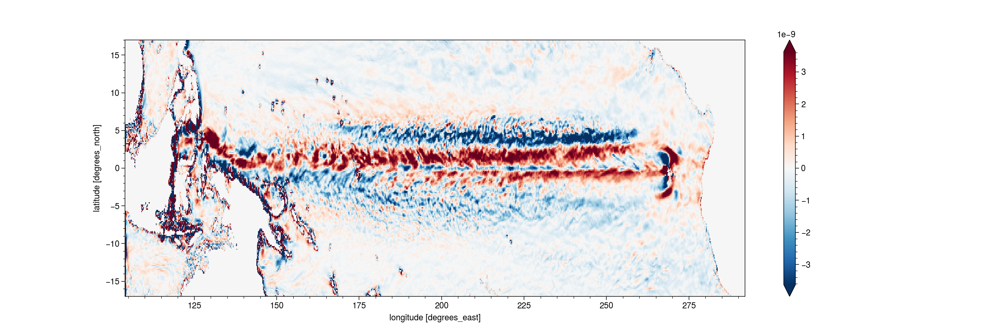

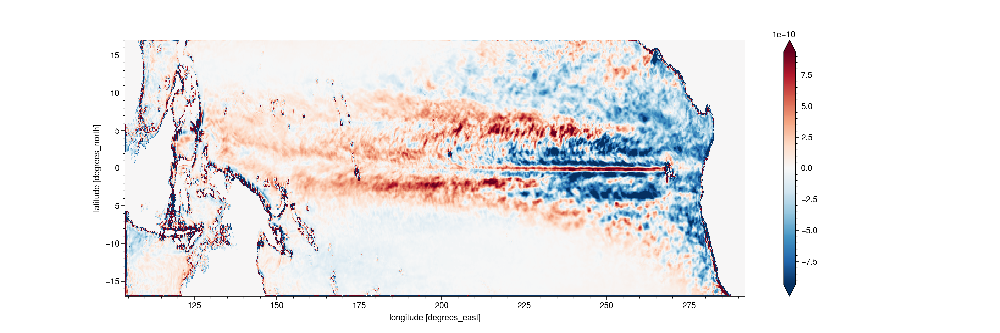

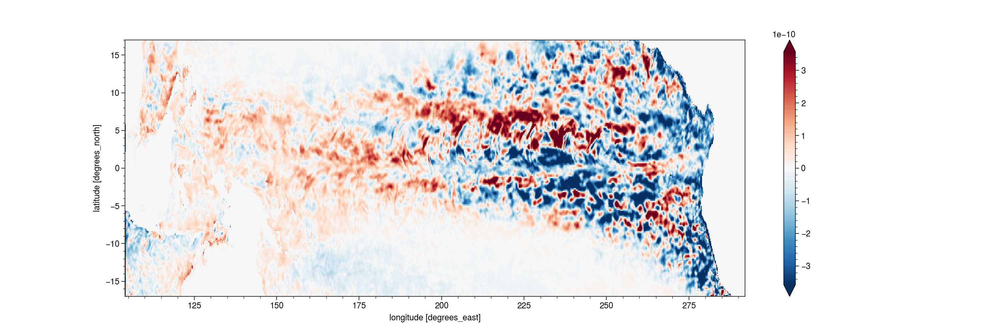

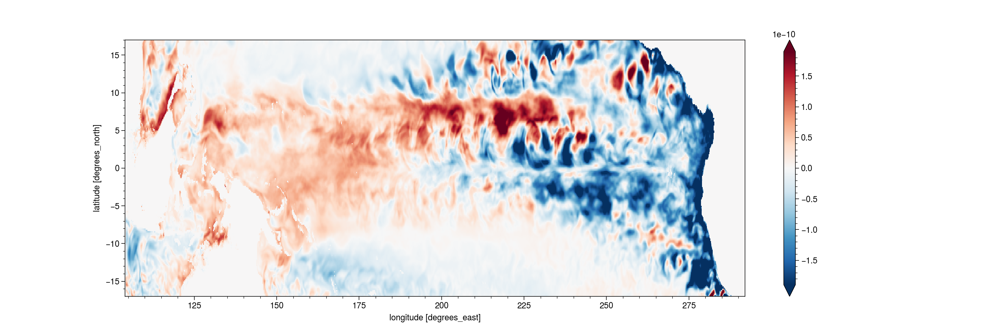

In [ ]:
Du=-50
Dl=-150

(((-dsw.adv_huO2-dsw.adv_vwO2-dsw.dif_h_O2-dsw.dif_v_O2+dsw.bio_O2)*dsx.rVOL).sel(Z=slice(Du,Dl)).sum('Z')/(dsx.rVOL.sel(Z=slice(Du,Dl)).sum('Z'))).plot(figsize=(15,5),robust=True,cmap='RdBu_r')
(((-dt.U_dO2-dt.V_dO2-dt.W_dO2-dsw.dif_h_O2-dsw.dif_v_O2+dsw.bio_O2)*dsx.rVOL).sel(Z=slice(Du,Dl)).sum('Z')/(dsx.rVOL.sel(Z=slice(Du,Dl)).sum('Z'))).plot(figsize=(15,5),robust=True,cmap='RdBu_r')
(((-dsw.adv_h_O2-dsw.adv_v_O2-dsw.dif_h_O2-dsw.dif_v_O2+dsw.bio_O2)*dsx.rVOL).sel(Z=slice(Du,Dl)).sum('Z')/(dsx.rVOL.sel(Z=slice(Du,Dl)).sum('Z'))).plot(figsize=(15,5),robust=True,cmap='RdBu_r')
(((dsw.tend_O2)*dsx.rVOL).sel(Z=slice(Du,Dl)).sum('Z')/(dsx.rVOL.sel(Z=slice(Du,Dl)).sum('Z'))).plot(figsize=(15,5),robust=True,cmap='RdBu_r')

In [42]:
dt=xr.open_mfdataset('/glade/scratch/yeddebba/Mesoscale/TPOSE/MITgcm_BLING_BUDGET_2010_2013_5DAY/budgets/adv_budget_2015.nc').isel(time=46)
dsw=xr.open_mfdataset('/glade/scratch/yeddebba/Mesoscale/TPOSE/MITgcm_BLING_BUDGET_2010_2013_5DAY/budgets/budgets_2015.nc').isel(time=45)
dsx=dsw

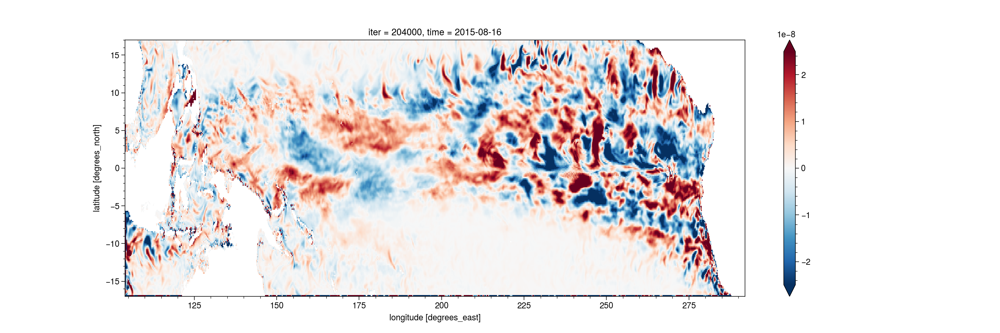

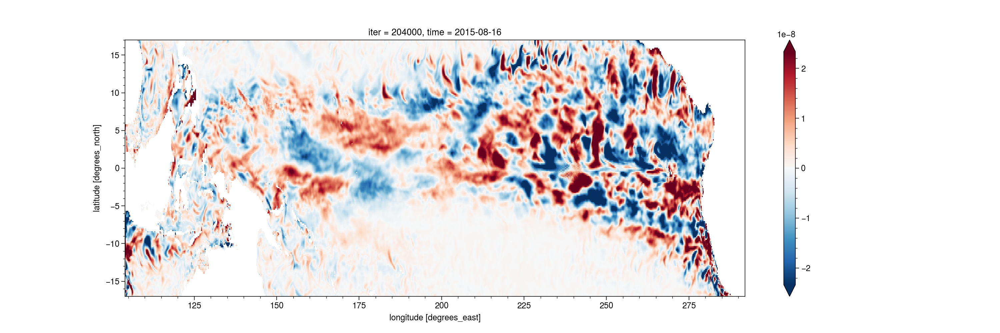

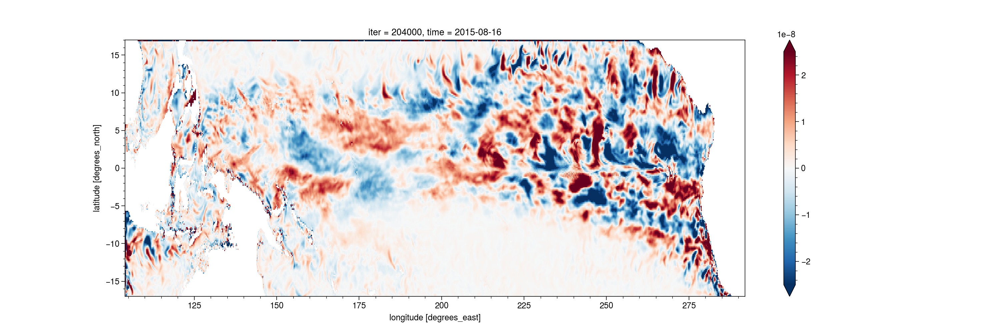

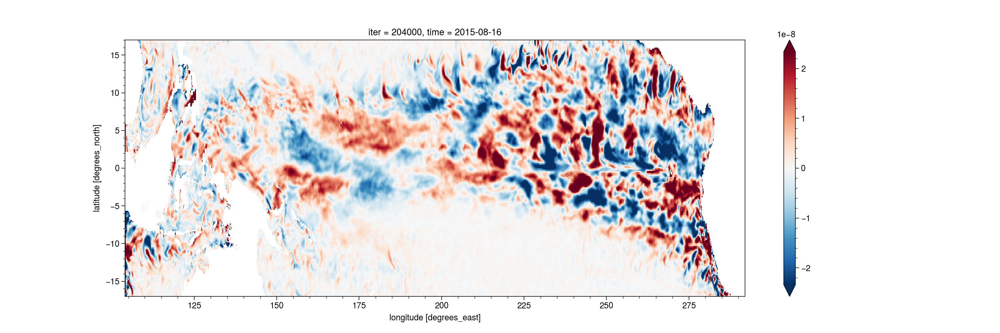

In [43]:
Du=-50
Dl=-150

(((-dt.U_dO2-dt.V_dO2-dt.W_dO2)*dsx.rVOL).sel(Z=slice(Du,Dl)).sum('Z')/(dsx.rVOL.sel(Z=slice(Du,Dl)).sum('Z'))).plot(figsize=(15,5),robust=True,cmap='RdBu_r')
(((-dsw.adv_h_O2-dsw.adv_v_O2)*dsx.rVOL).sel(Z=slice(Du,Dl)).sum('Z')/(dsx.rVOL.sel(Z=slice(Du,Dl)).sum('Z'))).plot(figsize=(15,5),robust=True,cmap='RdBu_r')

(((-dt.DIVm)*dsx.rVOL).sel(Z=slice(Du,Dl)).sum('Z')/(dsx.rVOL.sel(Z=slice(Du,Dl)).sum('Z'))).plot(figsize=(15,5),robust=True,cmap='RdBu_r')
(((-dsw.adv_huO2-dsw.adv_vwO2)*dsx.rVOL).sel(Z=slice(Du,Dl)).sum('Z')/(dsx.rVOL.sel(Z=slice(Du,Dl)).sum('Z'))).plot(figsize=(15,5),robust=True,cmap='RdBu_r')

100%|██████████| 12/12 [00:03<00:00,  3.26it/s]


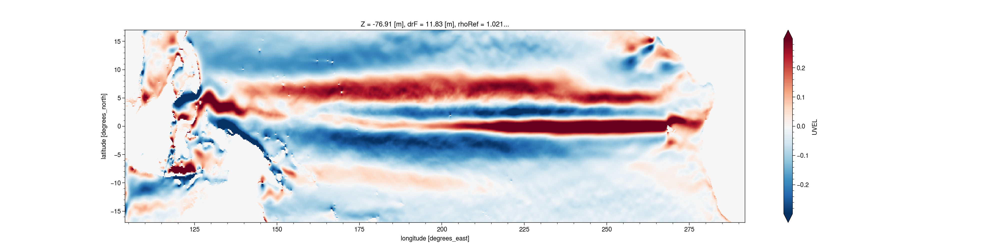

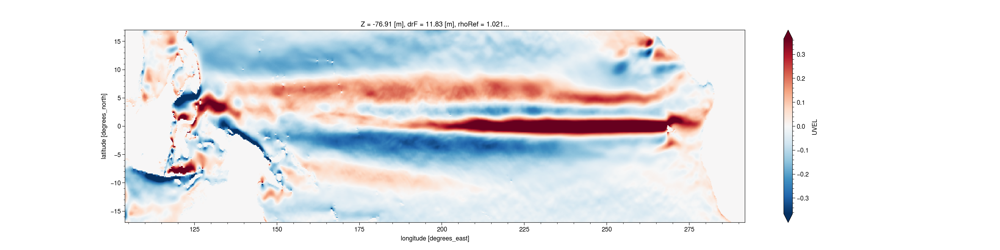

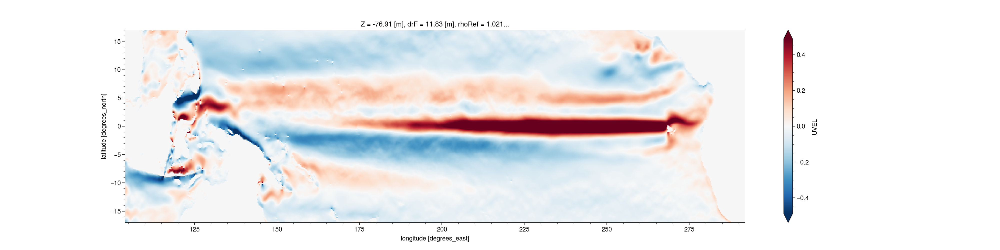

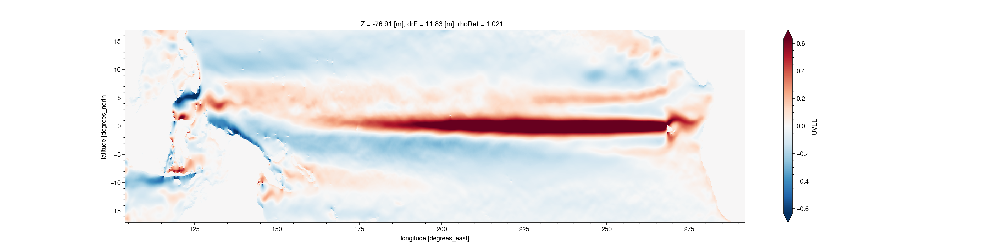

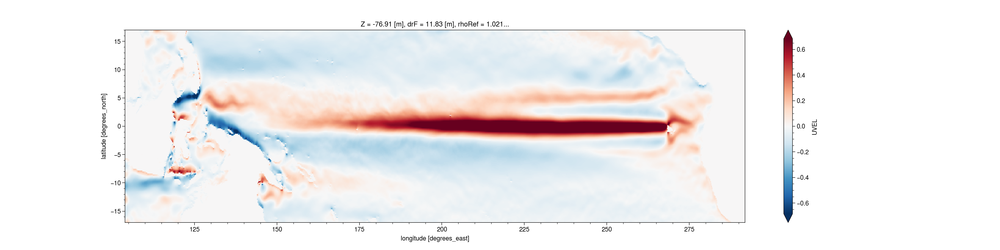

...

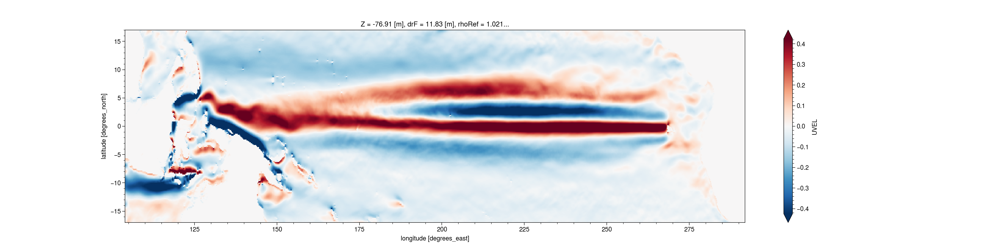

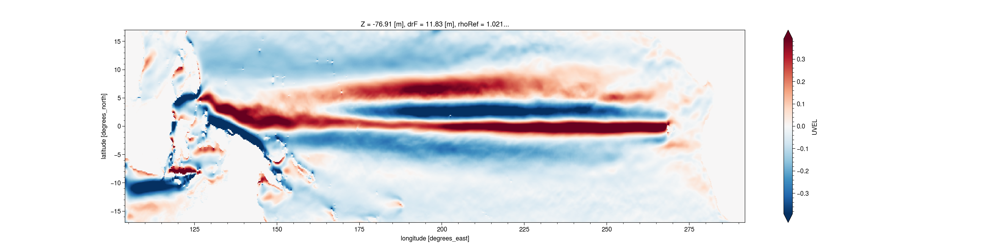

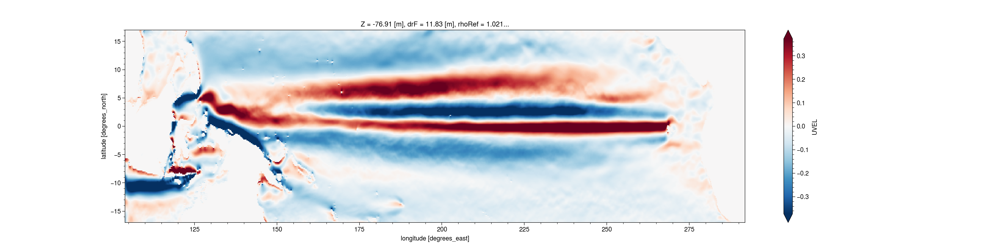

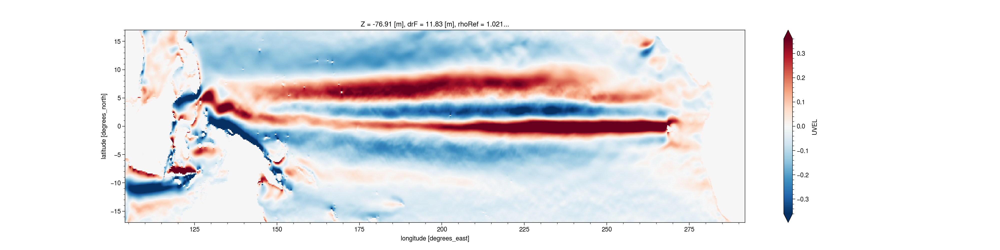

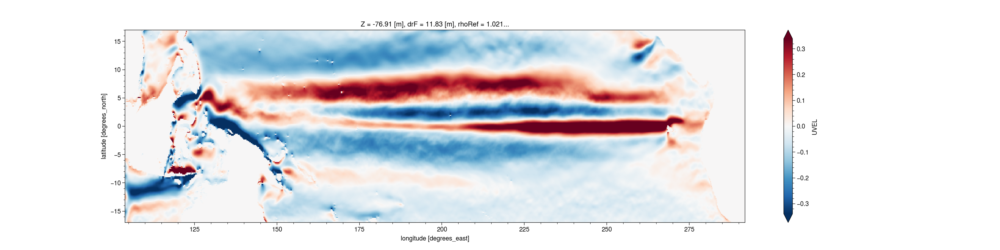

In [10]:
dl=xr.open_mfdataset('/glade/scratch/yeddebba/Mesoscale/TPOSE/MITgcm_BLING_BUDGET_2010_2013_5DAY/budgets/monthly/UVEL_monthly.nc')
# dl.tend_O2.isel(Z=10).mean('month').plot(figsize=(20,5),cmap='RdBu_r',vmin=-7e-9,vmax=7e-9)
for i in tqdm(np.arange(0,12,1)):
    dl.UVEL.isel(month=i,Z=10).plot(robust=True,figsize=(20,5),cmap='RdBu_r')